# Traffic Light Detection and Classification - Udacity CarND Capstone
Using a pre-trained model to detect objects in an image.

In [1]:
import numpy as np
import os
import sys
import tensorflow as tf
import time

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
%matplotlib inline

## Object detection imports

Here are the imports from the object detection module.

In [4]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

## Model preparation

In [5]:
ssd_inception_sim_model = 'frozen_models/frozen_sim_inception/frozen_inference_graph.pb'
ssd_inception_real_model = 'frozen_models/frozen_real_inception_6561/frozen_inference_graph.pb'
faster_rcnn_sim_model = 'frozen_models/faster_rcnn_frozen_sim/frozen_inference_graph.pb'
faster_rcnn_real_model = 'frozen_models/faster_rcnn_frozen_real/frozen_inference_graph.pb'

PATH_TO_LABELS = 'label_map.pbtxt'

NUM_CLASSES = 14

## Loading label map

Label maps map indices to category names, so that when our convolution network predicts 2, we know that this corresponds to Red. Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine.

In [8]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'id': 1, 'name': 'Green'}, 2: {'id': 2, 'name': 'Red'}, 3: {'id': 3, 'name': 'Yellow'}, 4: {'id': 4, 'name': 'off'}}


In [9]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [10]:
from glob import glob

## Detection

## 1. Testing SSD Inception Models

### 1.1 Testing model trained on simulator on simulator images

In [20]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_inception_sim_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [21]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_sim'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_sim/*.jpg
Length of test images: 12


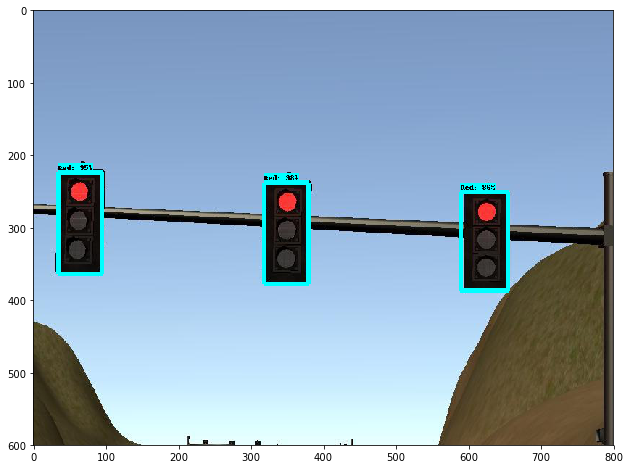

Red 0.982955
Distance (metres) 0.0
Time in milliseconds 1091.491937637329 

Red 0.957732
Distance (metres) 0.0
Time in milliseconds 1091.491937637329 

Red 0.861375
Distance (metres) 0.0
Time in milliseconds 1091.491937637329 



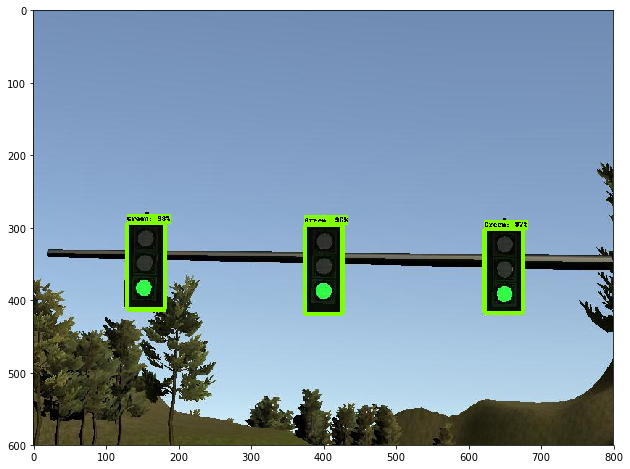

Green 0.985231
Distance (metres) 0.0
Time in milliseconds 55.56464195251465 

Green 0.973769
Distance (metres) 0.0
Time in milliseconds 55.56464195251465 

Green 0.965783
Distance (metres) 0.0
Time in milliseconds 55.56464195251465 



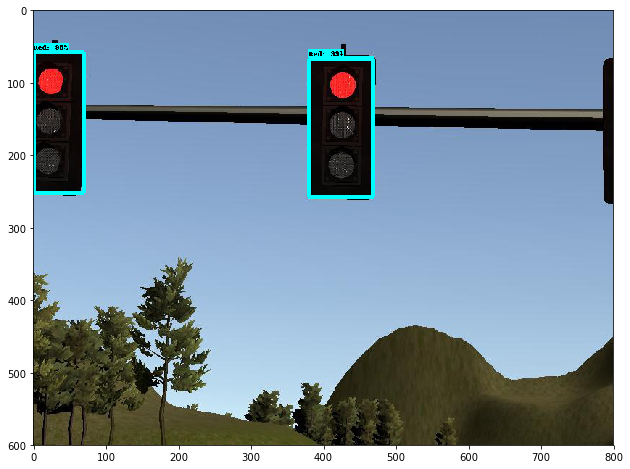

Red 0.990667
Distance (metres) 0.0
Time in milliseconds 54.140567779541016 

Red 0.959512
Distance (metres) 0.0
Time in milliseconds 54.140567779541016 



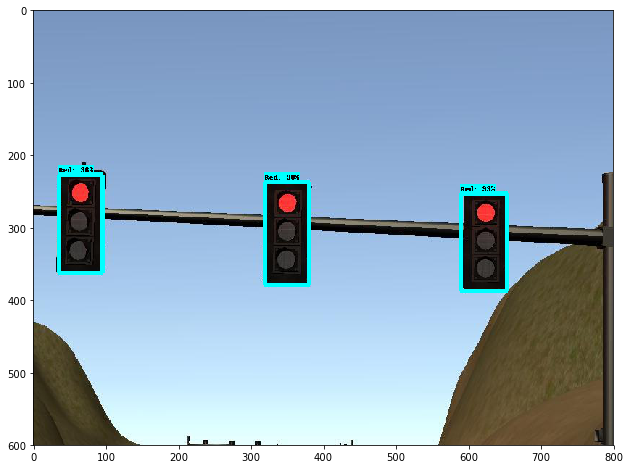

Red 0.988959
Distance (metres) 0.0
Time in milliseconds 54.04210090637207 

Red 0.960006
Distance (metres) 0.0
Time in milliseconds 54.04210090637207 

Red 0.937923
Distance (metres) 0.0
Time in milliseconds 54.04210090637207 



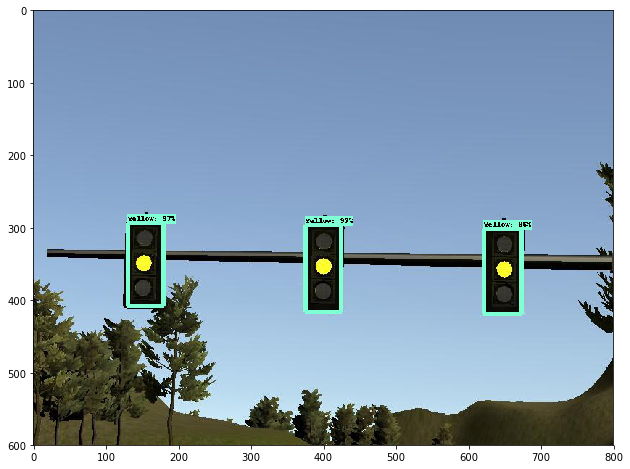

Yellow 0.979886
Distance (metres) 0.0
Time in milliseconds 54.25739288330078 

Yellow 0.975577
Distance (metres) 0.0
Time in milliseconds 54.25739288330078 

Yellow 0.967251
Distance (metres) 0.0
Time in milliseconds 54.25739288330078 



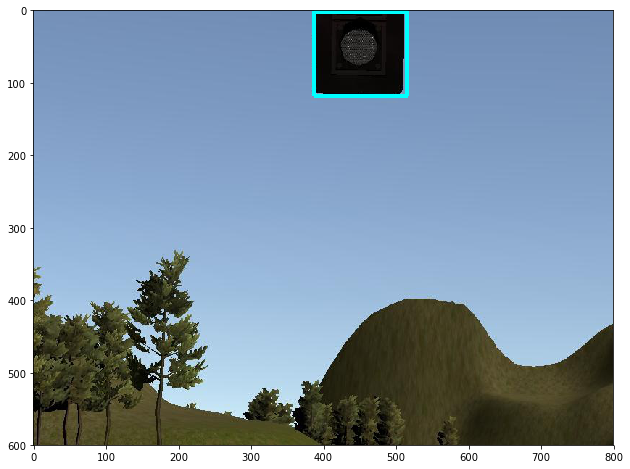

Red 0.848153
Distance (metres) 0.0
Time in milliseconds 54.73041534423828 



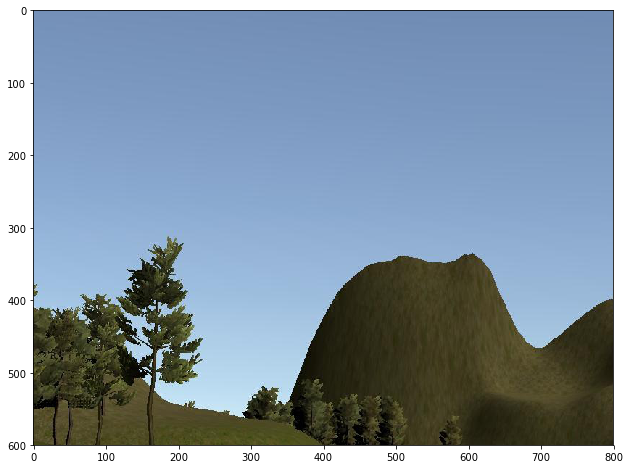

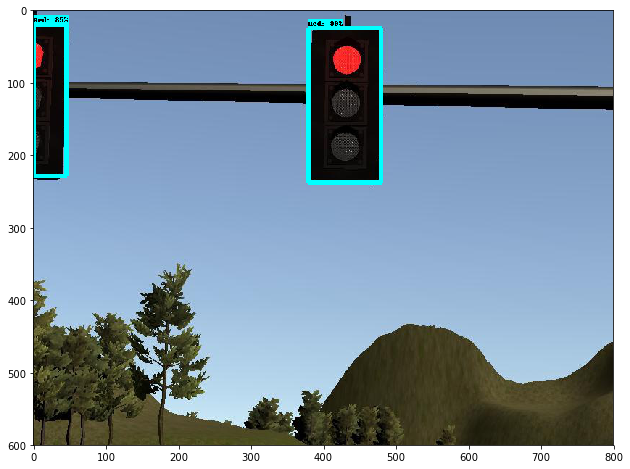

Red 0.995347
Distance (metres) 0.0
Time in milliseconds 56.455135345458984 

Red 0.855698
Distance (metres) 0.0
Time in milliseconds 56.455135345458984 



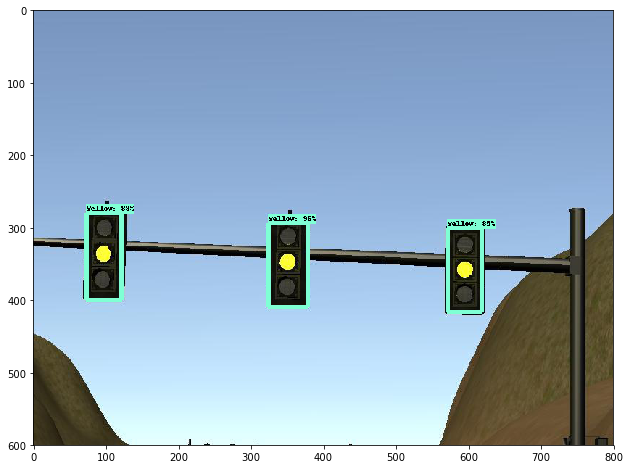

Yellow 0.964171
Distance (metres) 0.0
Time in milliseconds 58.6395263671875 

Yellow 0.886259
Distance (metres) 0.0
Time in milliseconds 58.6395263671875 

Yellow 0.856612
Distance (metres) 0.0
Time in milliseconds 58.6395263671875 



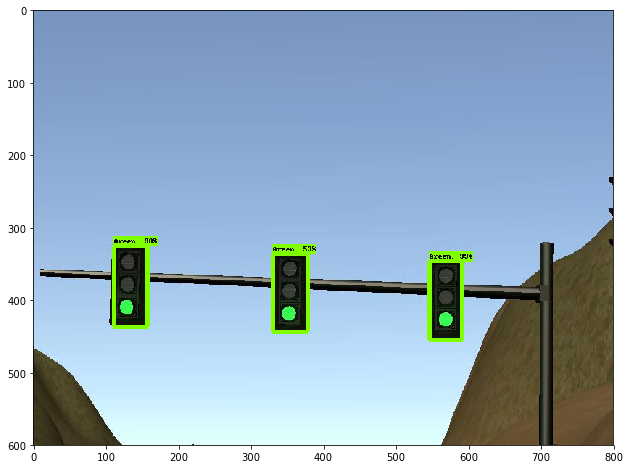

Green 0.992854
Distance (metres) 0.0
Time in milliseconds 55.09662628173828 

Green 0.985298
Distance (metres) 0.0
Time in milliseconds 55.09662628173828 

Green 0.538218
Distance (metres) 0.0
Time in milliseconds 55.09662628173828 



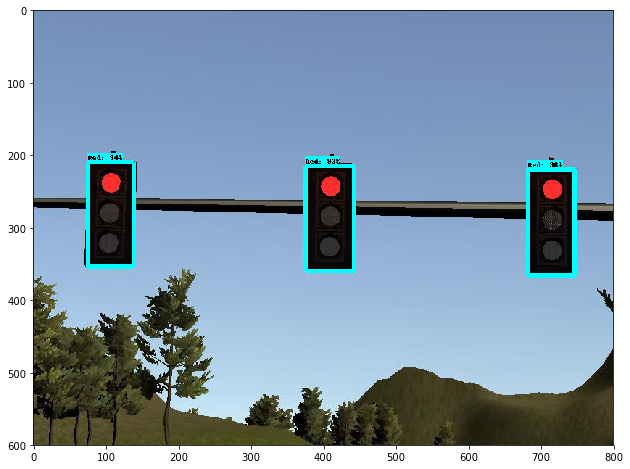

Red 0.962024
Distance (metres) 0.0
Time in milliseconds 56.2131404876709 

Red 0.947491
Distance (metres) 0.0
Time in milliseconds 56.2131404876709 

Red 0.921561
Distance (metres) 0.0
Time in milliseconds 56.2131404876709 



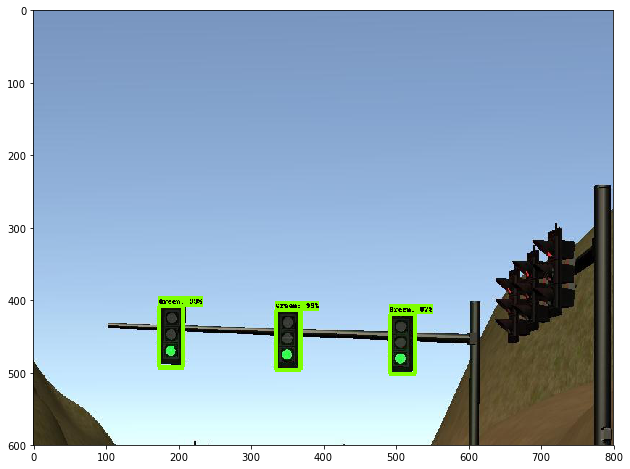

Green 0.99605
Distance (metres) 0.0
Time in milliseconds 56.67710304260254 

Green 0.990822
Distance (metres) 0.0
Time in milliseconds 56.67710304260254 

Green 0.870862
Distance (metres) 0.0
Time in milliseconds 56.67710304260254 



In [22]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428
                    fy =  1.73205
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n") 

### 1.2 Testing model trained on real images on Real World images

In [16]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(ssd_inception_real_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [17]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_udacity'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_udacity/*.jpg
Length of test images: 9


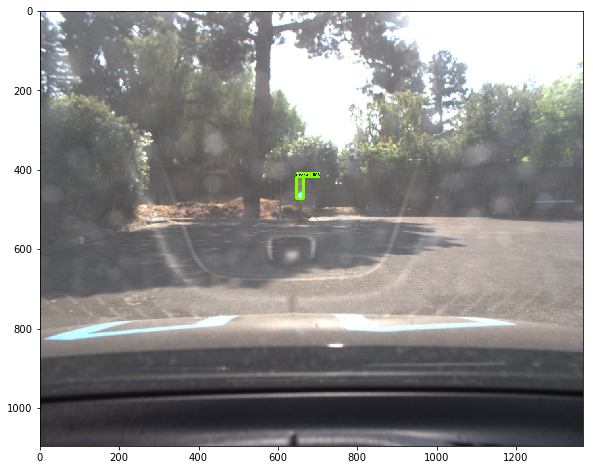

Green 0.999737
Distance (metres) 13.0
Time in milliseconds 1022.979736328125 



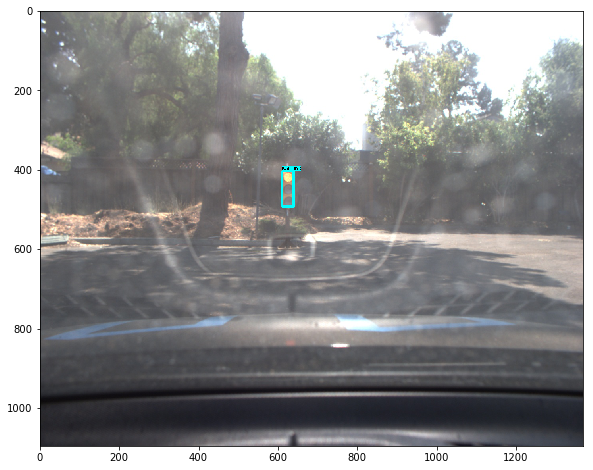

Red 0.999607
Distance (metres) 8.0
Time in milliseconds 53.27868461608887 



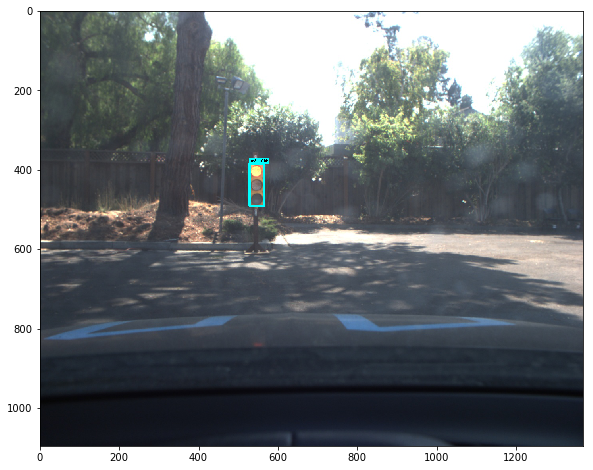

Red 0.999529
Distance (metres) 7.0
Time in milliseconds 56.12826347351074 



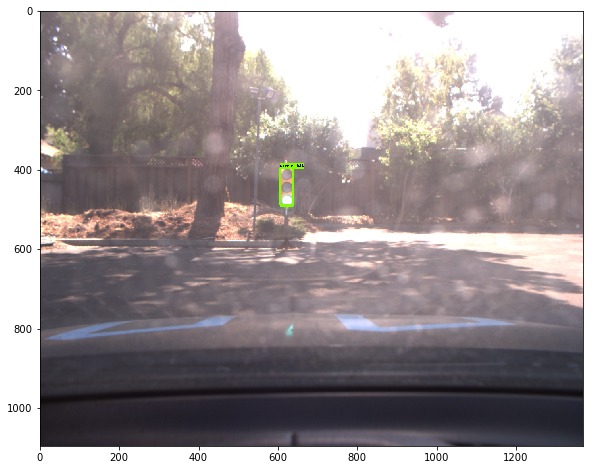

Green 0.999028
Distance (metres) 7.0
Time in milliseconds 54.473161697387695 



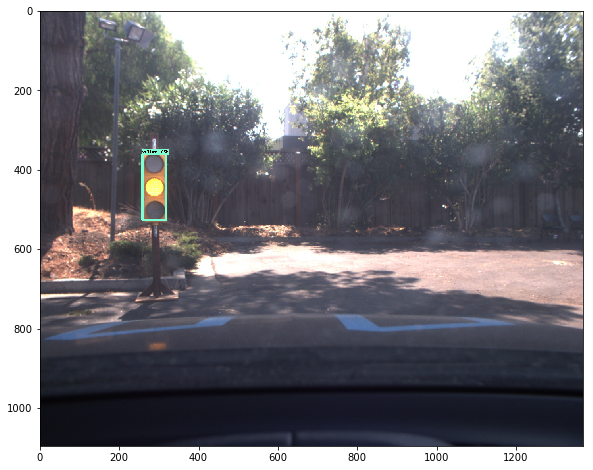

Yellow 0.6531
Distance (metres) 4.0
Time in milliseconds 55.39560317993164 



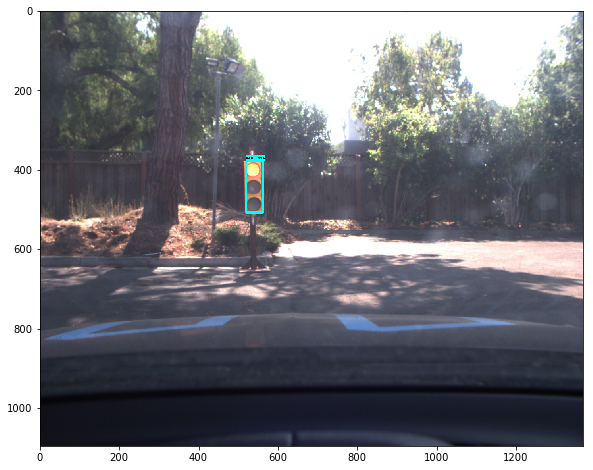

Red 0.999498
Distance (metres) 6.0
Time in milliseconds 53.511619567871094 



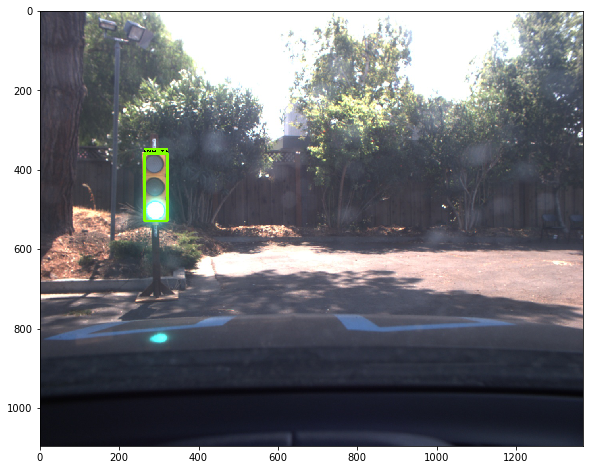

Green 0.993744
Distance (metres) 4.0
Time in milliseconds 56.115150451660156 



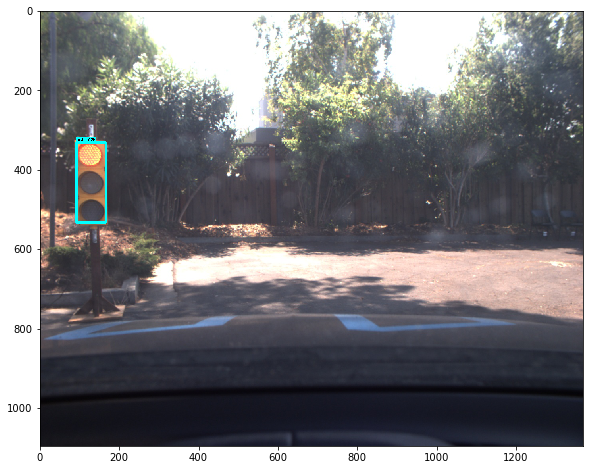

Red 0.975729
Distance (metres) 3.0
Time in milliseconds 53.85255813598633 



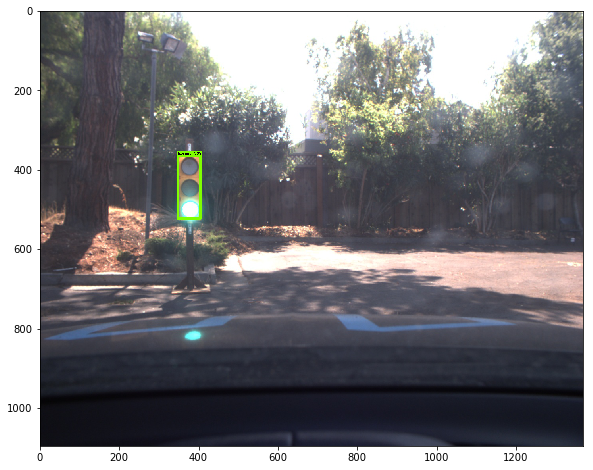

Green 0.998916
Distance (metres) 4.0
Time in milliseconds 53.83467674255371 



In [18]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  1345.200806
                    fy =  1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")

## 2. Testing Faster RCNN Models

### 2.1 Testing model trained on simulator on simulator images

In [23]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(faster_rcnn_sim_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [24]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_sim'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_sim/*.jpg
Length of test images: 12


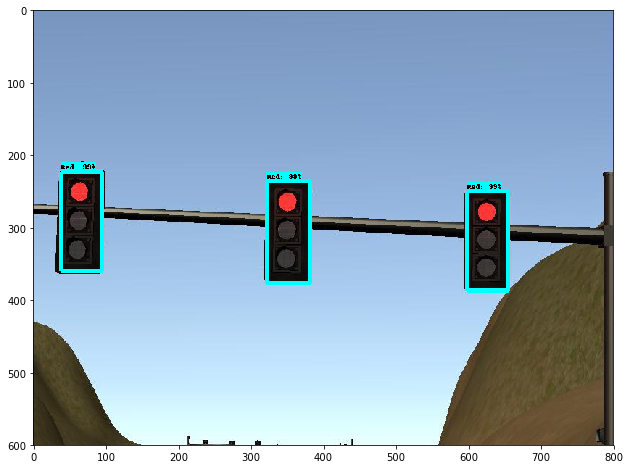

Red 0.995509
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 

Red 0.994898
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 

Red 0.993326
Distance (metres) 0.0
Time in milliseconds 3260.998010635376 



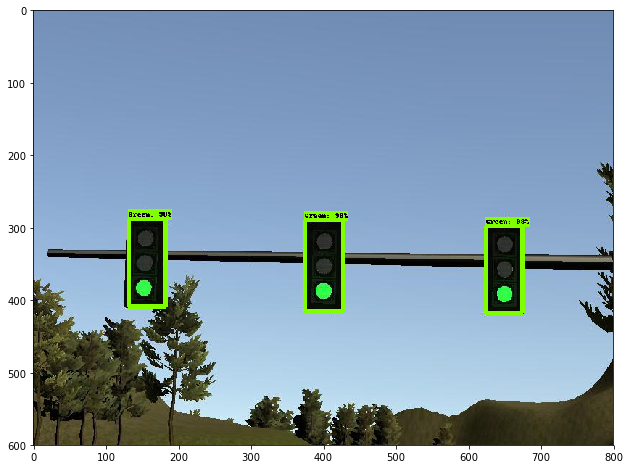

Green 0.987453
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 

Green 0.985762
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 

Green 0.983336
Distance (metres) 0.0
Time in milliseconds 169.19374465942383 



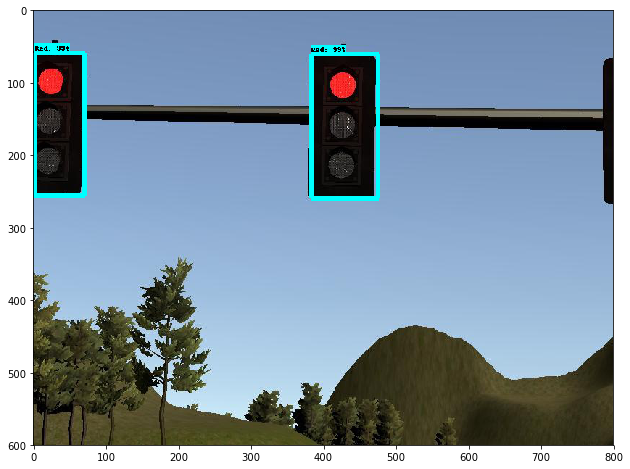

Red 0.993831
Distance (metres) 0.0
Time in milliseconds 159.7440242767334 

Red 0.993808
Distance (metres) 0.0
Time in milliseconds 159.7440242767334 



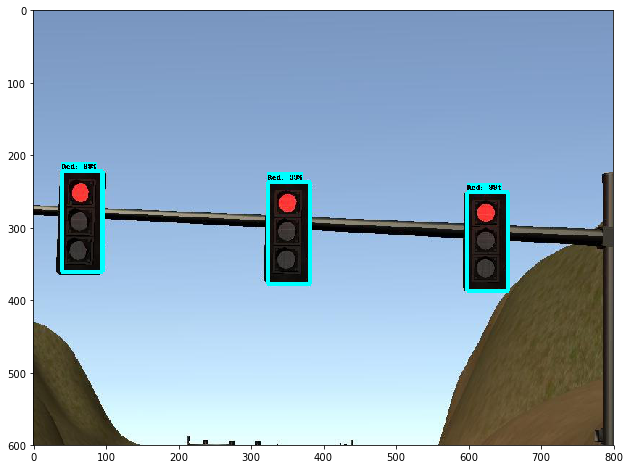

Red 0.996058
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 

Red 0.995183
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 

Red 0.993674
Distance (metres) 0.0
Time in milliseconds 154.58226203918457 



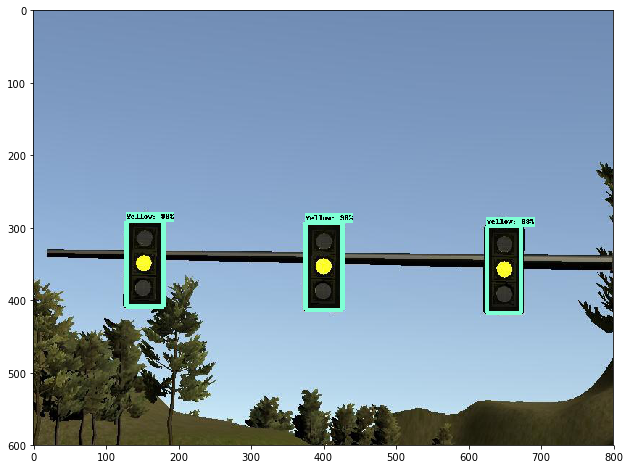

Yellow 0.997202
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 

Yellow 0.988186
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 

Yellow 0.981048
Distance (metres) 0.0
Time in milliseconds 155.5495262145996 



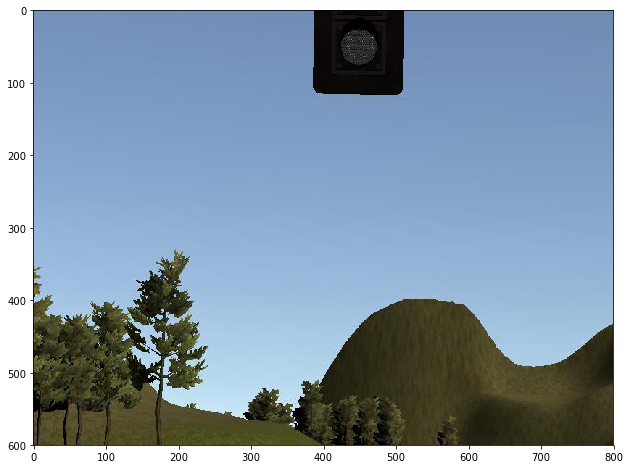

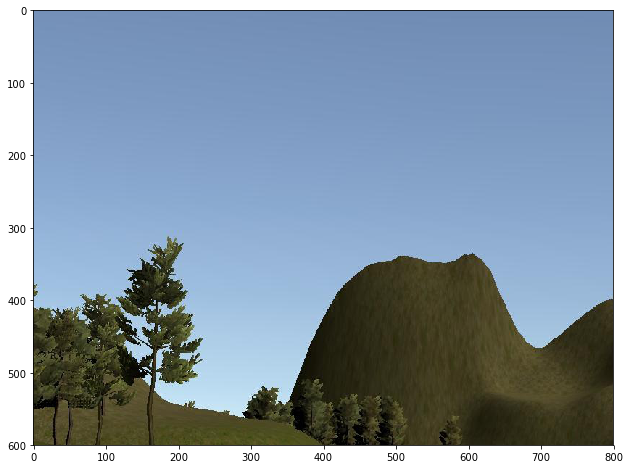

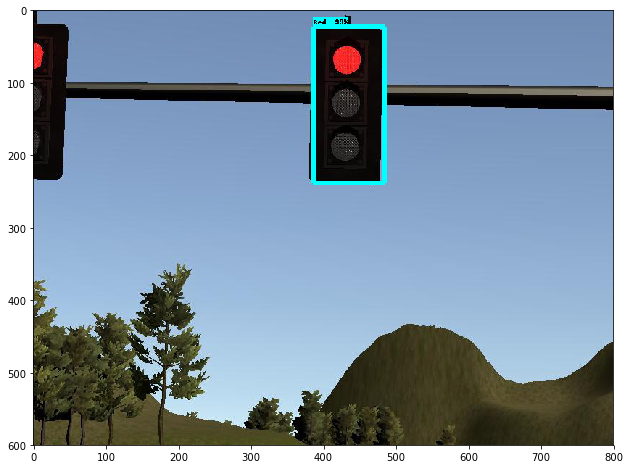

Red 0.993295
Distance (metres) 0.0
Time in milliseconds 155.22336959838867 



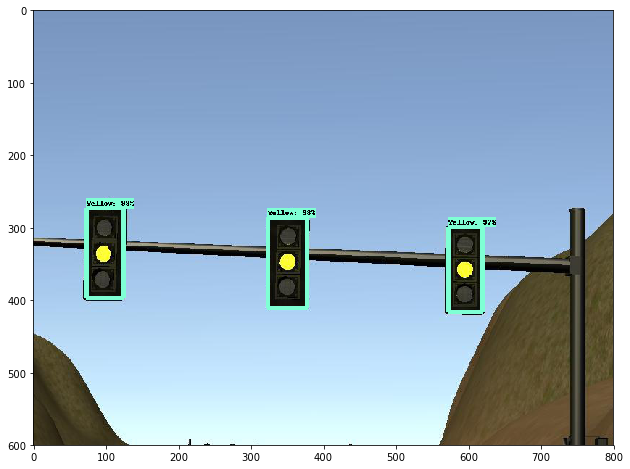

Yellow 0.988352
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 

Yellow 0.985127
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 

Yellow 0.97351
Distance (metres) 0.0
Time in milliseconds 155.89213371276855 



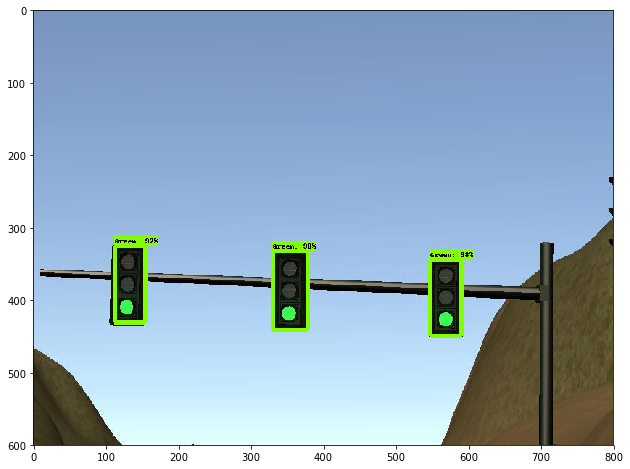

Green 0.987782
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 

Green 0.987745
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 

Green 0.979698
Distance (metres) 0.0
Time in milliseconds 155.69376945495605 



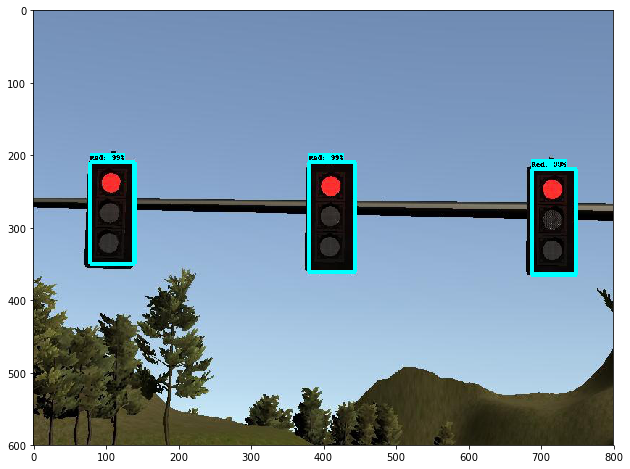

Red 0.997681
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 

Red 0.997158
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 

Red 0.995504
Distance (metres) 0.0
Time in milliseconds 155.0748348236084 



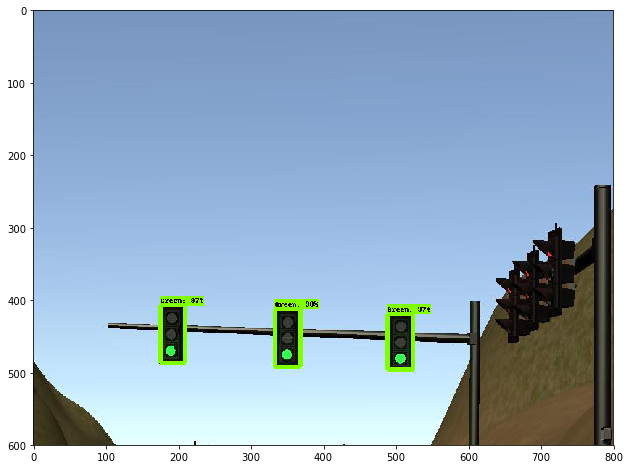

Green 0.986278
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 

Green 0.9739
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 

Green 0.971095
Distance (metres) 0.0
Time in milliseconds 154.82354164123535 



In [25]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  0.97428
                    fy =  1.73205
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n") 

### 2.2 Testing model trained on real images on Real World images

In [26]:
detection_graph = tf.Graph()

with detection_graph.as_default():
    
  od_graph_def = tf.GraphDef()

  with tf.gfile.GFile(faster_rcnn_real_model, 'rb') as fid:
        
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

In [27]:
PATH_TO_TEST_IMAGES_DIR = 'test_images_udacity'

print(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
TEST_IMAGE_PATHS = glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, '*.jpg'))
print("Length of test images:", len(TEST_IMAGE_PATHS))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

test_images_udacity/*.jpg
Length of test images: 9


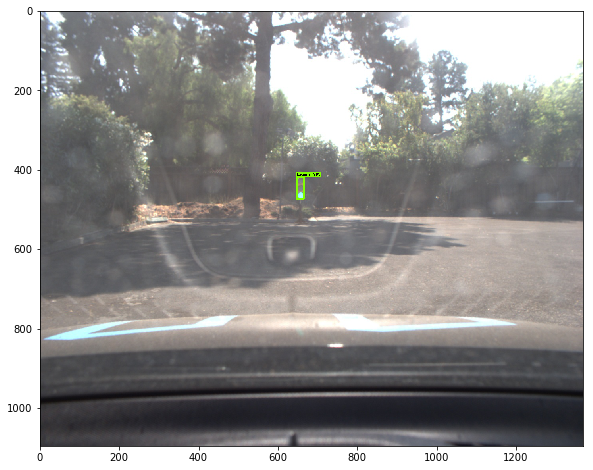

Green 0.99827
Distance (metres) 13.0
Time in milliseconds 3328.2885551452637 



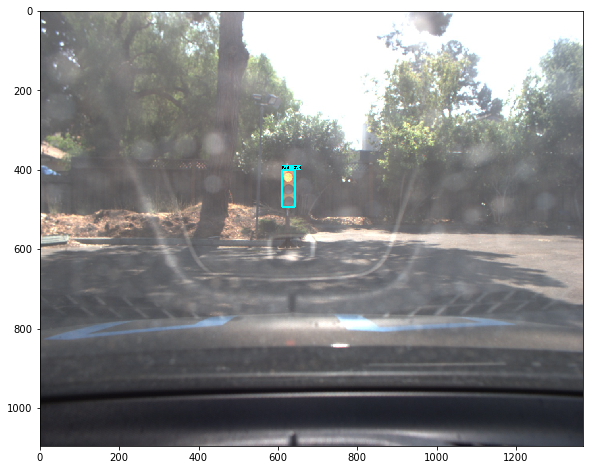

Red 0.99843
Distance (metres) 8.0
Time in milliseconds 410.22300720214844 



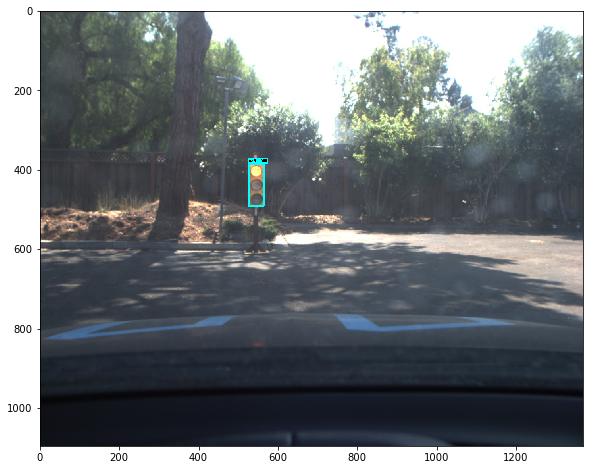

Red 0.998801
Distance (metres) 6.0
Time in milliseconds 380.94210624694824 



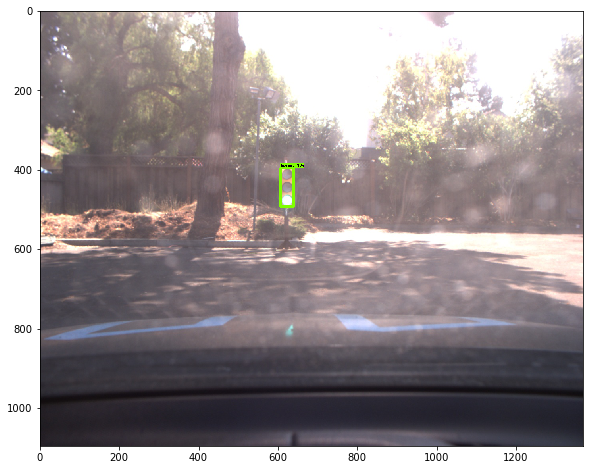

Green 0.999449
Distance (metres) 7.0
Time in milliseconds 378.5581588745117 



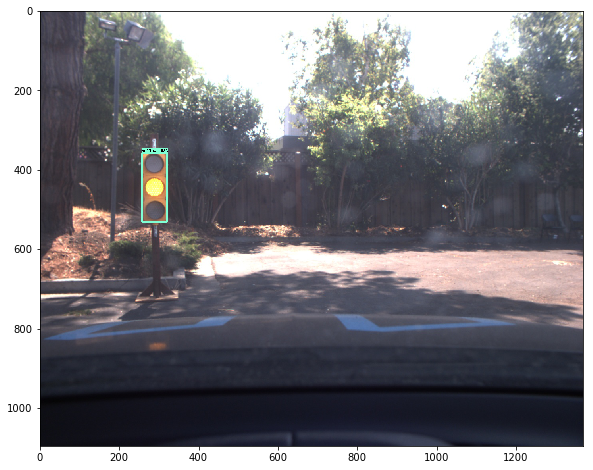

Yellow 0.99949
Distance (metres) 4.0
Time in milliseconds 387.96162605285645 



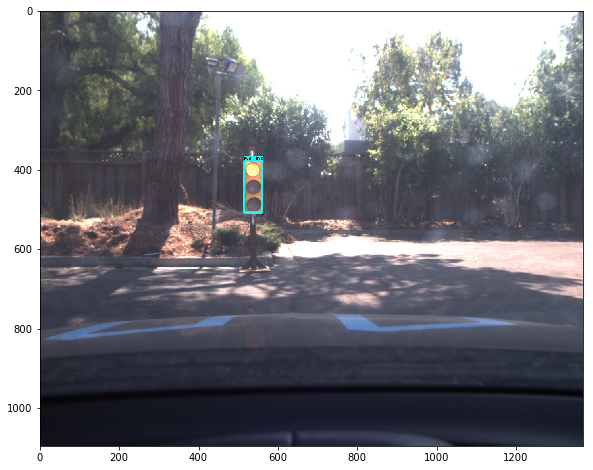

Red 0.999456
Distance (metres) 5.0
Time in milliseconds 393.0554389953613 



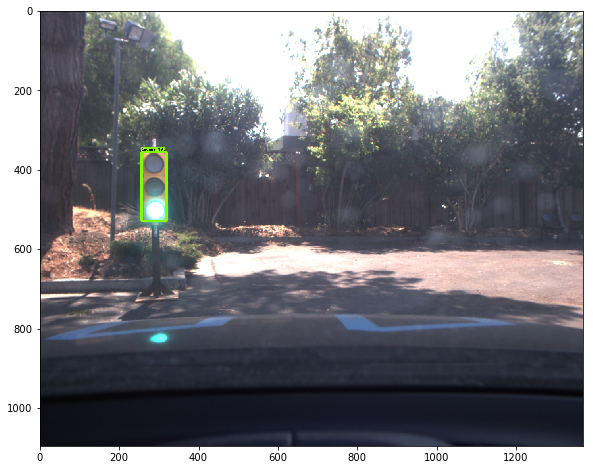

Green 0.998733
Distance (metres) 4.0
Time in milliseconds 397.3538875579834 



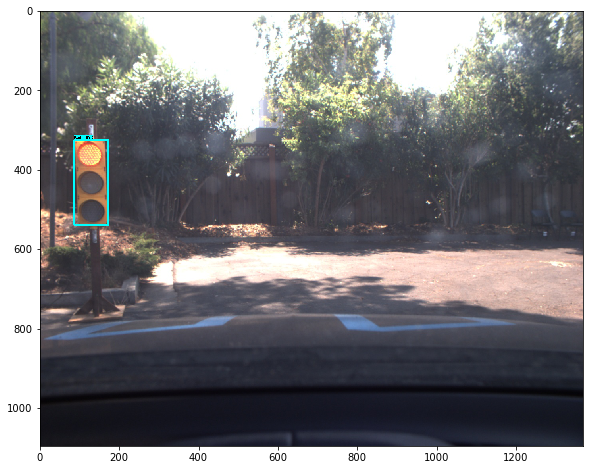

Red 0.999245
Distance (metres) 3.0
Time in milliseconds 382.9150199890137 



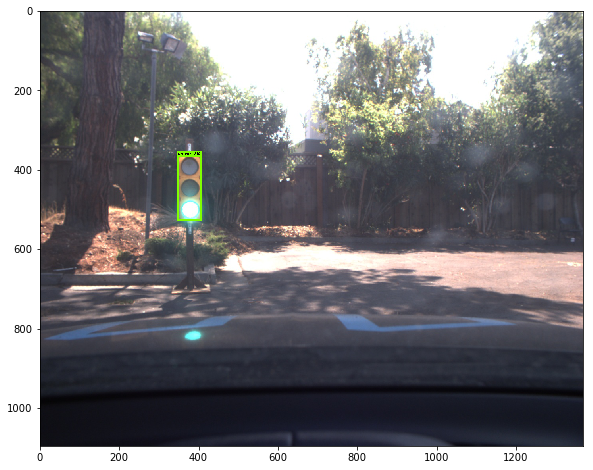

Green 0.999599
Distance (metres) 4.0
Time in milliseconds 388.6592388153076 



In [28]:
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        for image_path in TEST_IMAGE_PATHS:
            image = Image.open(image_path)
            # the array based representation of the image will be used later in order to prepare the
            # result image with boxes and labels on it.
            image_np = load_image_into_numpy_array(image)
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np_expanded = np.expand_dims(image_np, axis=0)

            time0 = time.time()

            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})

            time1 = time.time()

            boxes = np.squeeze(boxes)
            scores = np.squeeze(scores)
            classes = np.squeeze(classes).astype(np.int32)
            
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, boxes, classes, scores,
                category_index,
                use_normalized_coordinates=True,
                line_thickness=6)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()

            min_score_thresh = .50
            for i in range(boxes.shape[0]):
                if scores is None or scores[i] > min_score_thresh:

                    class_name = category_index[classes[i]]['name']
                    print('{}'.format(class_name), scores[i])
                    
                    fx =  1345.200806
                    fy =  1353.838257
                    perceived_width_x = (boxes[i][3] - boxes[i][1]) * 800
                    perceived_width_y = (boxes[i][2] - boxes[i][0]) * 600

                    # ymin, xmin, ymax, xmax = box
                    # depth_prime = (width_real * focal) / perceived_width
                    perceived_depth_x = ((.1 * fx) / perceived_width_x)
                    perceived_depth_y = ((.3 * fy) / perceived_width_y )

                    estimated_distance = round((perceived_depth_x + perceived_depth_y) / 2)
                    print("Distance (metres)", estimated_distance)
                    print("Time in milliseconds", (time1 - time0) * 1000, "\n")